In [12]:
#IMPORT'S
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from wordcloud import WordCloud
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import numpy as np

In [15]:
#Reading data for 2019 CSV

#Read Febrouary 2019 CSV.
dat_feb = pd.read_csv('data/data/2019/febrouary/listings.csv')
review_feb = pd.read_csv('data/data/2019/febrouary/reviews.csv')
dat_feb['month'] = 'Febrouary'
dat_feb['comments'] = review_feb['comments']

#Read March 2019 CSV
data_mar = pd.read_csv('data/data/2019/march/listings.csv')
review_mar = pd.read_csv('data/data/2019/march/reviews.csv')
data_mar['month'] = 'March'
data_mar['comments'] = review_mar['comments']

#Read April 2019 CSV
data_apr = pd.read_csv('data/data/2019/april/listings.csv')
review_apr = pd.read_csv('data/data/2019/april/reviews.csv')
data_apr['month'] = 'April'
data_apr['comments'] = review_apr['comments']

#Mix 3 CSV for 2019
combined_data = pd.concat([dat_feb, data_mar, data_apr], ignore_index=True)

combined_data = combined_data.loc[:, [
    'id',
    'zipcode',
    'transit',
    'bedrooms',
    'beds',
    'review_scores_rating',
    'number_of_reviews',
    'neighbourhood',
    'name',
    'latitude',
    'longitude',
    'last_review',
    'instant_bookable',
    'host_since',
    'host_response_rate',
    'host_identity_verified',
    'host_has_profile_pic',
    'first_review',
    'description',
    'city',
    'cancellation_policy',
    'bed_type',
    'bathrooms',
    'accommodates',
    'amenities',
    'room_type',
    'property_type',
    'price',
    'availability_365',
    'minimum_nights',
    'month',
    'comments',
    'host_id'
]]

combined_data.to_csv('new_csv', index=False)  # index=False για να μην περιλαμβάνεται ο αριθμός γραμμής στο αρχείο
new_data = pd.read_csv('new_csv')

# Αφαίρεσε το σύμβολο "$" από τις τιμές στη στήλη "price"
new_data['price'] = new_data['price'].str.replace('$', '')
# Αντικατάσταση των χαρακτήρων που δεν είναι αριθμοί με κενό
new_data['price'] = new_data['price'].str.replace(',', '').astype(float)

#Missing Data
missing_data = new_data.isna().sum()
cleaned_data = new_data.dropna()

#Save clean data to a new CSV
cleaned_data.to_csv('train_2019', index=False)
new_data = pd.read_csv('train_2019')

C:\Users\giorg\AppData\Local\Temp\ipykernel_1352\149889779.py:4: DtypeWarning: Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.
  dat_feb = pd.read_csv('data/data/2019/febrouary/listings.csv')
C:\Users\giorg\AppData\Local\Temp\ipykernel_1352\149889779.py:10: DtypeWarning: Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.
  data_mar = pd.read_csv('data/data/2019/march/listings.csv')
C:\Users\giorg\AppData\Local\Temp\ipykernel_1352\149889779.py:16: DtypeWarning: Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.
  data_apr = pd.read_csv('data/data/2019/april/listings.csv')


In [17]:
#Reading data for 2023 CSV.

#Read June 2023 CSV.
dat_june = pd.read_csv('data/data/2023/june/listings.csv')
review_june = pd.read_csv('data/data/2023/june/reviews.csv')
dat_june['month'] = 'June'
dat_june['comments'] = review_june['comments']

#Read March 2023 CSV
data_mar1 = pd.read_csv('data/data/2023/march/listings.csv')
review_mar1 = pd.read_csv('data/data/2023/march/reviews.csv')
data_mar1['month'] = 'March'
data_mar1['comments'] = review_mar1['comments']

#Read September 2023 CSV
data_sept = pd.read_csv('data/data/2023/september/listings.csv')
review_sept = pd.read_csv('data/data/2023/september/reviews.csv')
data_sept['month'] = 'September'
data_sept['comments'] = review_sept['comments']

#Mix 3 CSV for 2023
combined_data1 = pd.concat([data_mar1, dat_june, data_sept], ignore_index=True)

combined_data1 = combined_data1.loc[:, [
    'id',
    'bedrooms',
    'beds',
    'review_scores_rating',
    'number_of_reviews',
    'neighbourhood',
    'neighbourhood_cleansed',
    'name',
    'latitude',
    'longitude',
    'last_review',
    'instant_bookable',
    'host_since',
    'host_response_rate',
    'host_identity_verified',
    'host_has_profile_pic',
    'first_review',
    'description',
    'bathrooms',
    'accommodates',
    'amenities',
    'room_type',
    'property_type',
    'price',
    'availability_365',
    'minimum_nights',
    'month',
    'comments',
    'host_id'
]]

combined_data1.to_csv('new_csv1', index=False)  # index=False για να μην περιλαμβάνεται ο αριθμός γραμμής στο αρχείο
new_data1 = pd.read_csv('new_csv1')


# Αφαίρεσε το σύμβολο "$" από τις τιμές στη στήλη "price"
new_data1['price'] = new_data1['price'].str.replace('$', '')
# Αντικατάσταση των χαρακτήρων που δεν είναι αριθμοί με κενό
new_data1['price'] = new_data1['price'].str.replace(',', '').astype(float)



#Save clean data to a new CSV
new_data1.to_csv('train_2023', index=False)
new_data1 = pd.read_csv('train_2023')

DONE


In [18]:
#1.1 Ποιός είναι ο πιο συχνός τύπος room_type για τα δεδομένα σας;
def room_type(new_data):
    room_type_counts = new_data['room_type'].value_counts()
    print("Ο πιό συχνός τύπος room_type είναι:",room_type_counts.idxmax())


#Calling func for 2019
room_type(new_data)
#Calling func for 2023
room_type(new_data1)

Ο πιό συχνός τύπος room_type είναι: Entire home/apt
Ο πιό συχνός τύπος room_type είναι: Entire home/apt


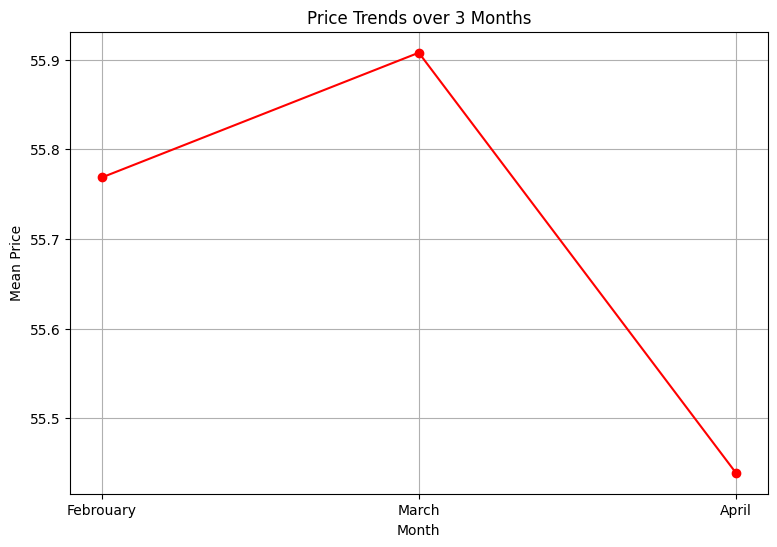

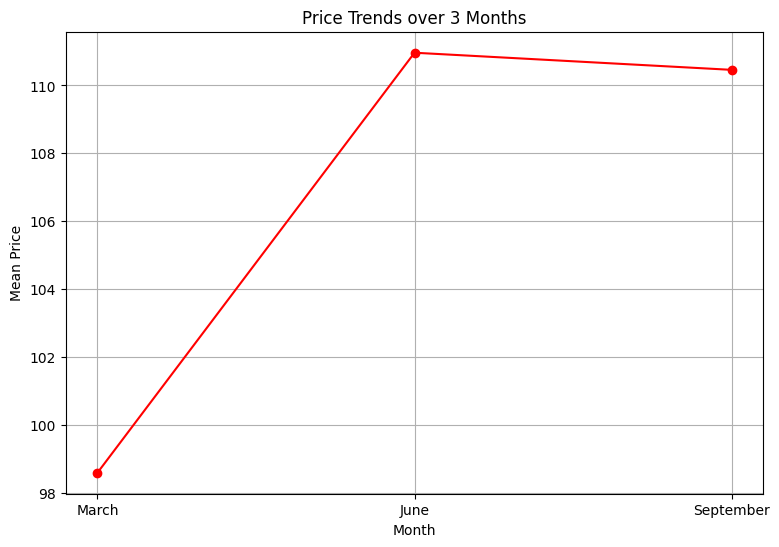

In [20]:
#1.2 Φτιάξτε γράφημα ή γραφήματα που δείχνουν την πορεία των τιμών για το διάστημα των 3 μηνών.

def prices_per_month(new_data):

    #Ομαδοποίηση των δεδομένων ανά μήνα και υπολογισμός του μέσου όρου τιμών για κάθε μήνα
    monthly_mean_prices = new_data.groupby('month')['price'].mean()
    #Βάζουμε τους μήνες στη σειρά που θέλουμε να εμφανιστούν
    months_order = ['Febrouary', 'March', 'April']
    #Αναδιάταξη του DataFrame βάσει της σειράς των μηνών
    monthly_mean_prices_ordered = monthly_mean_prices.reindex(months_order)

    #Εμφάνιση του γραφήματος γραμμής
    plt.figure(figsize=(9, 6))
    monthly_mean_prices_ordered.plot(marker='o', color='red', linestyle='-')
    plt.title('Price Trends over 3 Months')
    plt.xlabel('Month')
    plt.ylabel('Mean Price')
    plt.xticks(range(len(monthly_mean_prices_ordered)), ['Febrouary', 'March', 'April'])
    plt.grid(True)
    plt.show()

def prices_per_month_2023(new_data):

    #Ομαδοποίηση των δεδομένων ανά μήνα και υπολογισμός του μέσου όρου τιμών για κάθε μήνα
    monthly_mean_prices = new_data.groupby('month')['price'].mean()
    #Βάζουμε τους μήνες στη σειρά που θέλουμε να εμφανιστούν
    months_order = ['March', 'June', 'September']
    #Αναδιάταξη του DataFrame βάσει της σειράς των μηνών
    monthly_mean_prices_ordered = monthly_mean_prices.reindex(months_order)

    #Εμφάνιση του γραφήματος γραμμής
    plt.figure(figsize=(9, 6))
    monthly_mean_prices_ordered.plot(marker='o', color='red', linestyle='-')
    plt.title('Price Trends over 3 Months')
    plt.xlabel('Month')
    plt.ylabel('Mean Price')
    plt.xticks(range(len(monthly_mean_prices_ordered)), ['March', 'June', 'September'])
    plt.grid(True)
    plt.show()

#Calling func for 2019
prices_per_month(new_data)
#Calling func for 2023
prices_per_month_2023(new_data1)

In [21]:
#1.3 Ποιές είναι οι 5 πρώτες γειτονιές με τις περισσότερες κριτικές;
def neighbourhoods(new_data):
    #Ομαδοποίηση των κριτικών ανά γειτονιά και υπολογισμός του συνόλου τους
    neighborhood_reviews = new_data.groupby('neighbourhood')['number_of_reviews'].sum().sort_values(ascending=False)
    #Επιλογή των 5 πρώτων γειτονιών με τις περισσότερες κριτικές
    top_5_neighborhoods = neighborhood_reviews.head(5)
    print("Οι 5 πρώτες γειτονιές με τις περισσότερες κριτικές είναι:")
    print(top_5_neighborhoods)

def neighbourhoods_2023(new_data):
    #Ομαδοποίηση των κριτικών ανά γειτονιά και υπολογισμός του συνόλου τους
    neighborhood_reviews = new_data.groupby('neighbourhood_cleansed')['number_of_reviews'].sum().sort_values(ascending=False)
    #Επιλογή των 5 πρώτων γειτονιών με τις περισσότερες κριτικές
    top_5_neighborhoods = neighborhood_reviews.head(5)
    print("Οι 5 πρώτες γειτονιές με τις περισσότερες κριτικές είναι:")
    print(top_5_neighborhoods)

#Calling func for 2019
neighbourhoods(new_data)
#Calling func for 2023
neighbourhoods_2023(new_data1)

Οι 5 πρώτες γειτονιές με τις περισσότερες κριτικές είναι:
neighbourhood
Plaka          107938
Koukaki         74272
Neos Kosmos     63953
Psyri           42451
Pangrati        32774
Name: number_of_reviews, dtype: int64
Οι 5 πρώτες γειτονιές με τις περισσότερες κριτικές είναι:
neighbourhood_cleansed
ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ              433513
ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ                 207147
ΝΕΟΣ ΚΟΣΜΟΣ                         129434
ΜΟΥΣΕΙΟ-ΕΞΑΡΧΕΙΑ-ΝΕΑΠΟΛΗ            103904
ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ    102836
Name: number_of_reviews, dtype: int64


In [23]:
#1.4  Ποιά είναι η γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων;
def neighbourhood(new_data):
    #Ομαδοποίηση των καταχωρήσεων ανά γειτονιά και υπολογισμός του πλήθους τους
    neighborhood_listings = new_data['neighbourhood'].value_counts()

    #Εύρεση της γειτονιάς με τις περισσότερες καταχωρήσεις
    neighborhood_with_most_listings = neighborhood_listings.idxmax()
    print("Η γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων είναι:", neighborhood_with_most_listings)

def neighbourhood_2023(new_data):
    #Ομαδοποίηση των καταχωρήσεων ανά γειτονιά και υπολογισμός του πλήθους τους
    neighborhood_listings = new_data['neighbourhood_cleansed'].value_counts()

    #Εύρεση της γειτονιάς με τις περισσότερες καταχωρήσεις
    neighborhood_with_most_listings = neighborhood_listings.idxmax()
    print("Η γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων είναι:", neighborhood_with_most_listings)

#Calling func for 2019
neighbourhood(new_data)
#Calling func for 2023
neighbourhood_2023(new_data1)

Η γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων είναι: Plaka
Η γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων είναι: ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ


In [24]:
#1.5 Πόσες είναι οι καταχωρήσεις ανά γειτονιά και ανά μήνα;
def listings_per_neighbourhood_month(new_data):
    #Ομαδοποίηση των δεδομένων ανά γειτονιά και μετά ανά μήνα και μέτρηση των καταχωρήσεων
    listings_per_neighbourhood_per_month = new_data.groupby(['neighbourhood', 'month']).size()
    print(listings_per_neighbourhood_per_month)

def listings_per_neighbourhood_month_2023(new_data):
    #Ομαδοποίηση των δεδομένων ανά γειτονιά και μετά ανά μήνα και μέτρηση των καταχωρήσεων
    listings_per_neighbourhood_per_month = new_data.groupby(['neighbourhood_cleansed', 'month']).size()
    print(listings_per_neighbourhood_per_month)

#Calling func for 2019
listings_per_neighbourhood_month(new_data)
#Calling func for 2023
listings_per_neighbourhood_month_2023(new_data1)

neighbourhood   month    
Agios Loukas    April         19
                Febrouary     18
                March         19
Agios Nikolaos  April         98
                Febrouary     79
                            ... 
Thiseio         Febrouary    177
                March         51
Votanikos       April         35
                Febrouary     29
                March         32
Length: 96, dtype: int64
neighbourhood_cleansed  month    
1Ο ΝΕΚΡΟΤΑΦΕΙΟ          June          51
                        March         45
                        September     55
ΑΓΙΟΣ ΕΛΕΥΘΕΡΙΟΣ        June          30
                        March         31
                                    ... 
ΣΤΑΔΙΟ                  March        219
                        September    252
ΣΤΑΘΜΟΣ ΛΑΡΙΣΗΣ         June          89
                        March         80
                        September     85
Length: 132, dtype: int64


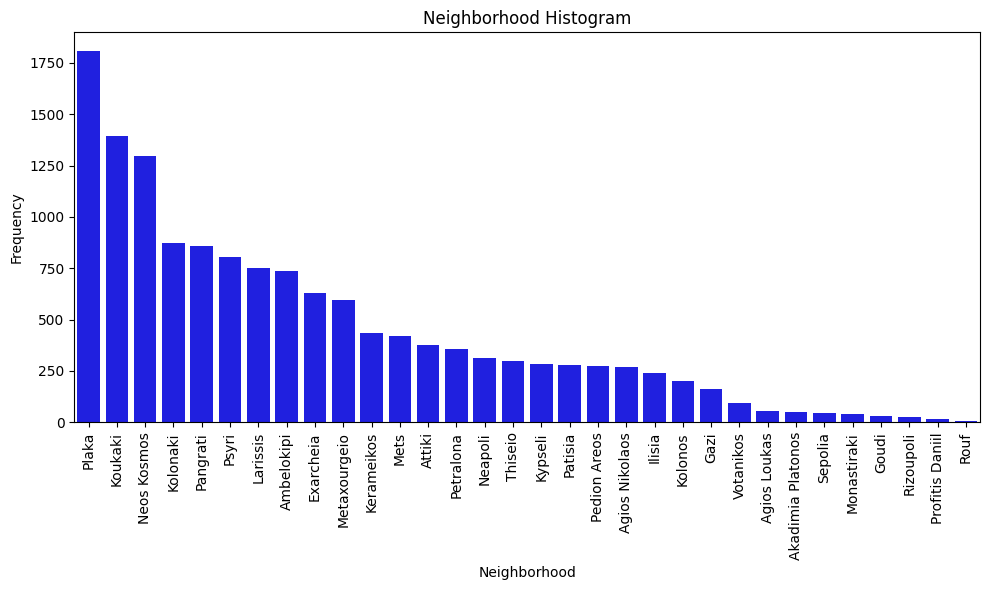

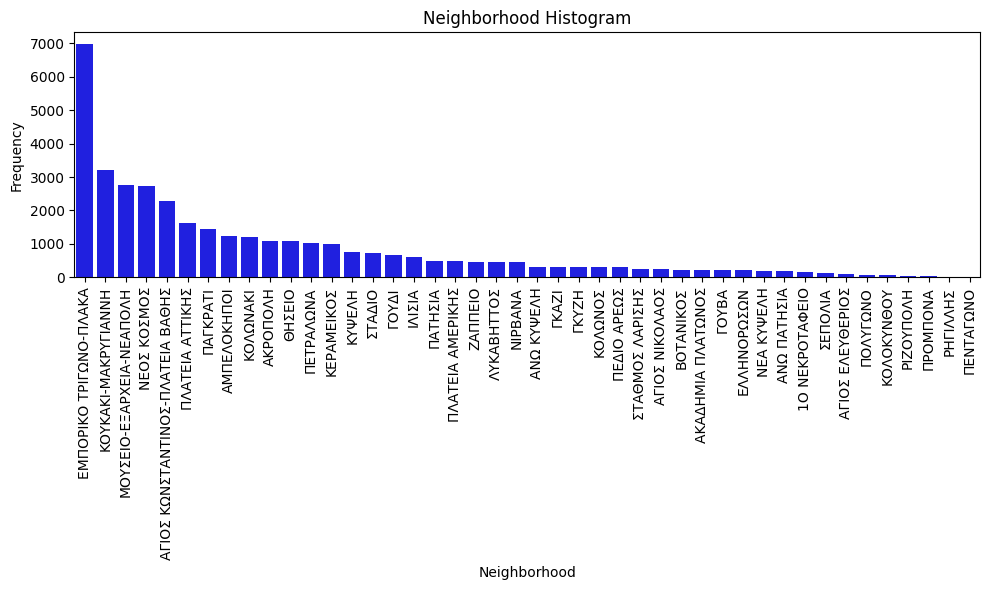

In [25]:
#1.6 Σχεδιάστε το ιστόγραμμα της μεταβλητής neighborhood.
def histogram_neighbourhood(new_data):
    #Υπολογίζουμε τον αριθμό των καταχωρήσεων σε κάθε μία γειτονιά.
    neighborhood_counts = new_data['neighbourhood'].value_counts()

    #Σχεδίαση του ιστογράμματος
    plt.figure(figsize=(10, 6))
    sns.barplot(x=neighborhood_counts.index, y=neighborhood_counts.values, color='blue')
    plt.title('Neighborhood Histogram')
    plt.xlabel('Neighborhood')
    plt.ylabel('Frequency')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()
def histogram_neighbourhood_2023(new_data):
    #Υπολογίζουμε τον αριθμό των καταχωρήσεων σε κάθε μία γειτονιά.
    neighborhood_counts = new_data['neighbourhood_cleansed'].value_counts()

    #Σχεδίαση του ιστογράμματος
    plt.figure(figsize=(10, 6))
    sns.barplot(x=neighborhood_counts.index, y=neighborhood_counts.values, color='blue')
    plt.title('Neighborhood Histogram')
    plt.xlabel('Neighborhood')
    plt.ylabel('Frequency')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

#Calling func for 2019
histogram_neighbourhood(new_data)
#Calling func for 2023
histogram_neighbourhood_2023(new_data1)

In [26]:
#1.7 Ποιος είναι ο πιο συχνός τύπος δωματίου (room_type) σε κάθε γειτονιά (neighborhood);
def most_common_value(x):
    return x.mode()[0]

def most_common_room_type(new_data):
    # Ομαδοποίηση των δεδομένων ανά γειτονιά και υπολογισμός του πιο συχνού τύπου δωματίου
    most_common_room_type_per_neighbourhood = new_data.groupby('neighbourhood')['room_type'].apply(most_common_value)
    print("Ο πιό συχνός τύπος δωματίου σε κάθε γειτονιά είναι: ",most_common_room_type_per_neighbourhood)

def most_common_room_type_2023(new_data):
    # Ομαδοποίηση των δεδομένων ανά γειτονιά και υπολογισμός του πιο συχνού τύπου δωματίου
    most_common_room_type_per_neighbourhood = new_data.groupby('neighbourhood_cleansed')['room_type'].apply(most_common_value)
    print("Ο πιό συχνός τύπος δωματίου σε κάθε γειτονιά είναι: ",most_common_room_type_per_neighbourhood)


#Calling func for 2019
most_common_room_type(new_data)
#Calling func for 2023
most_common_room_type_2023(new_data1)

Ο πιό συχνός τύπος δωματίου σε κάθε γειτονιά είναι:  neighbourhood
Agios Loukas         Entire home/apt
Agios Nikolaos       Entire home/apt
Akadimia Platonos    Entire home/apt
Ambelokipi           Entire home/apt
Attiki               Entire home/apt
Exarcheia            Entire home/apt
Gazi                 Entire home/apt
Goudi                Entire home/apt
Ilisia               Entire home/apt
Kerameikos           Entire home/apt
Kolonaki             Entire home/apt
Kolonos              Entire home/apt
Koukaki              Entire home/apt
Kypseli              Entire home/apt
Larissis             Entire home/apt
Metaxourgeio         Entire home/apt
Mets                 Entire home/apt
Monastiraki          Entire home/apt
Neapoli              Entire home/apt
Neos Kosmos          Entire home/apt
Pangrati             Entire home/apt
Patisia              Entire home/apt
Pedion Areos         Entire home/apt
Petralona            Entire home/apt
Plaka                Entire home/apt
Profitis

In [28]:
#1.8 Ποιός είναι ο πιο ακριβός τύπος δωματίου;
def most_expensive_room_type(new_data):
    #Υπολογίζουμε τη μεγαλύτερη τιμή που υπάρχει και βρίσκουμε τον τύπο δωματίου που περιέχει αυτήν την τιμή.
    most_expensive = new_data['price'].idxmax()
    most_expensive_room = new_data.loc[most_expensive, ['room_type', 'price']]
    print(most_expensive_room)

#Calling func for 2019
most_expensive_room_type(new_data)
#Calling func for 2023
most_expensive_room_type(new_data1)

room_type    Entire home/apt
price                 1000.0
Name: 1550, dtype: object
room_type    Entire home/apt
price                80275.0
Name: 27368, dtype: object


In [30]:
#1.9 Χρησιμοποιήστε τη βιβλιοθήκη Folium Map με τις στήλες latitude/longitude και
#εμφανίστε σε ένα χάρτη για ένα μήνα της επιλογής σας τα ακίνητα και στα popup στον
#χάρτη επιλέξτε όποια άλλη πληροφορία θέλετε να εμφανίζεται για το ακίνητο (πχ
#bed_type, room_type, transit κτλ).

# Φιλτράρουμε τα δεδομένα για τον επιλεγμένο μήνα (τον Φεβρουάριο)
filtered_data = new_data[new_data['month'] == 'March']

# Δημιουργούμε έναν χάρτη Folium
latitude_mean = filtered_data['latitude'].mean()
longitude_mean = filtered_data['longitude'].mean()
map = folium.Map(location=[latitude_mean, longitude_mean], zoom_start=12)

for index, row in filtered_data.iterrows():
    popup_info = f"Room type: {row['room_type']}<br>Transit: {row['transit']}<br>Bed Type: {row['bed_type']}"
    folium.Marker([row['latitude'], row['longitude']], popup=popup_info).add_to(map)

# Εμφανίζουμε το χάρτη
map

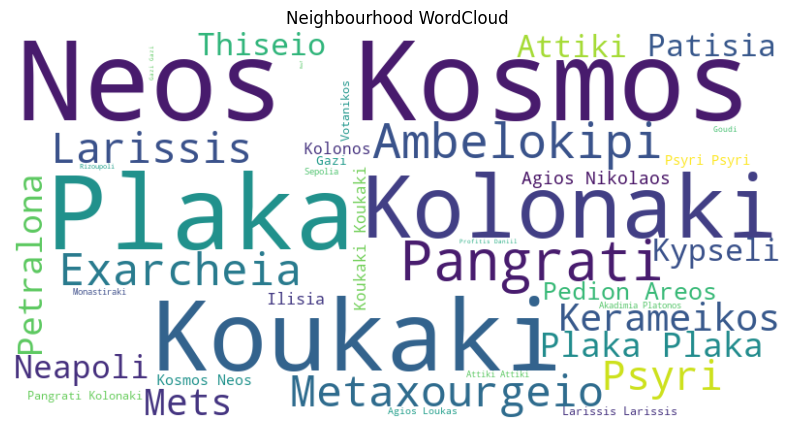

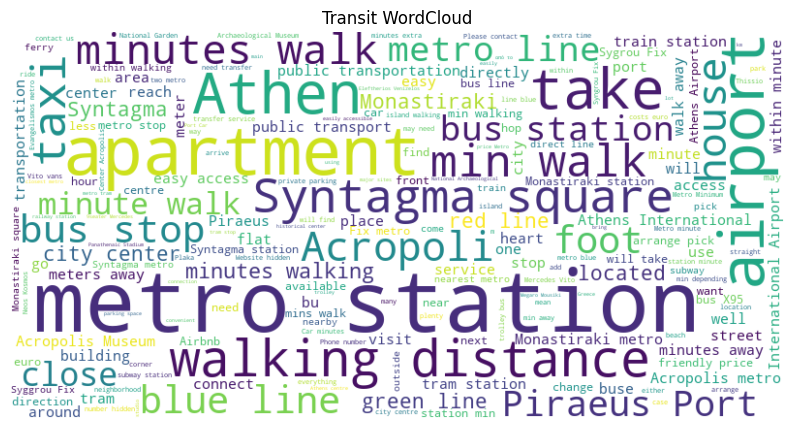

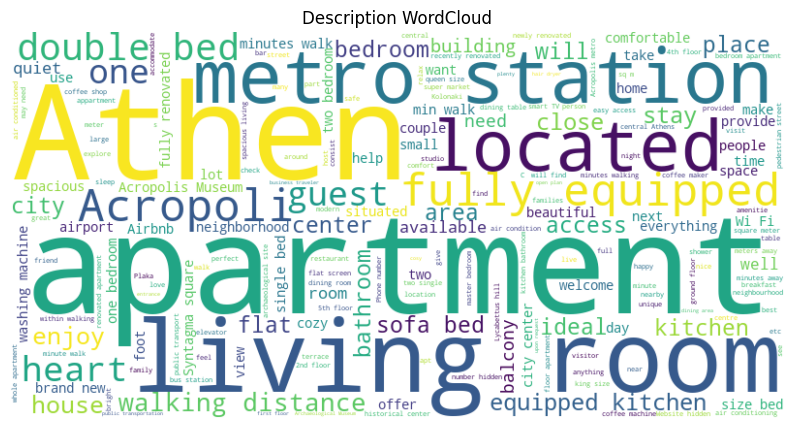

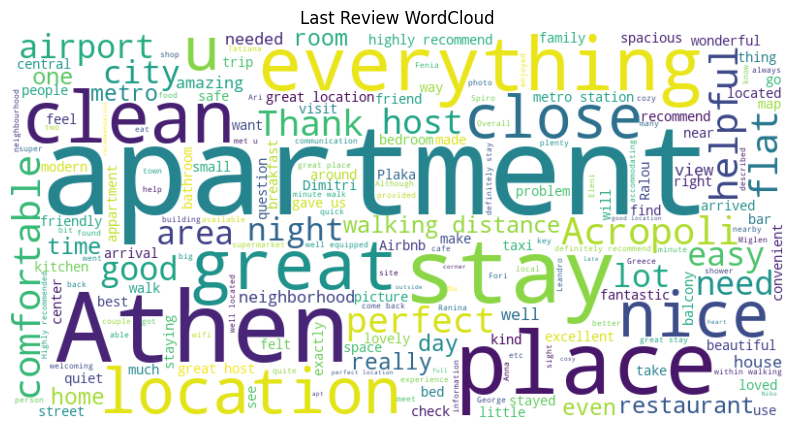

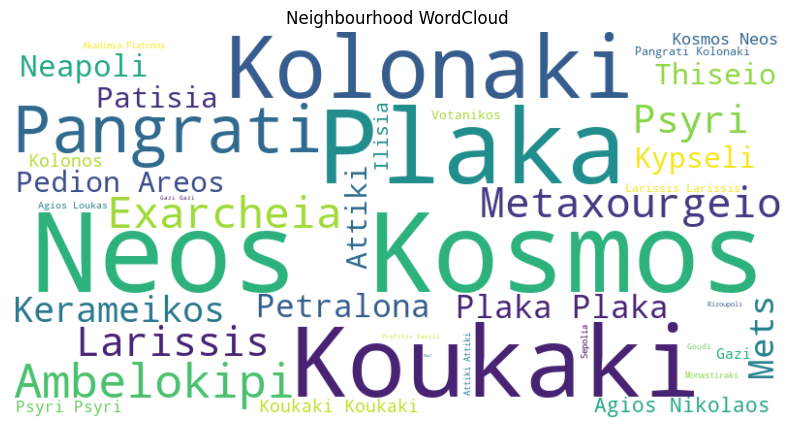

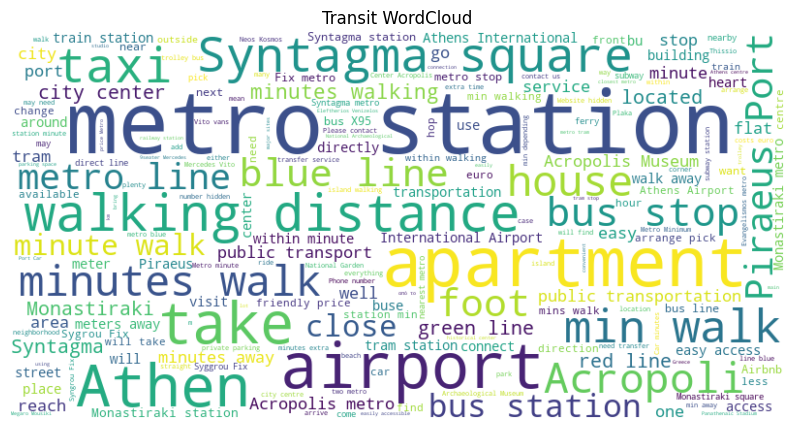

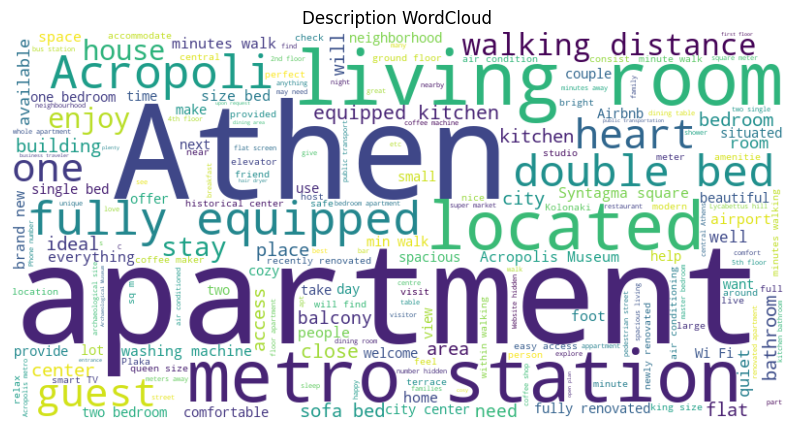

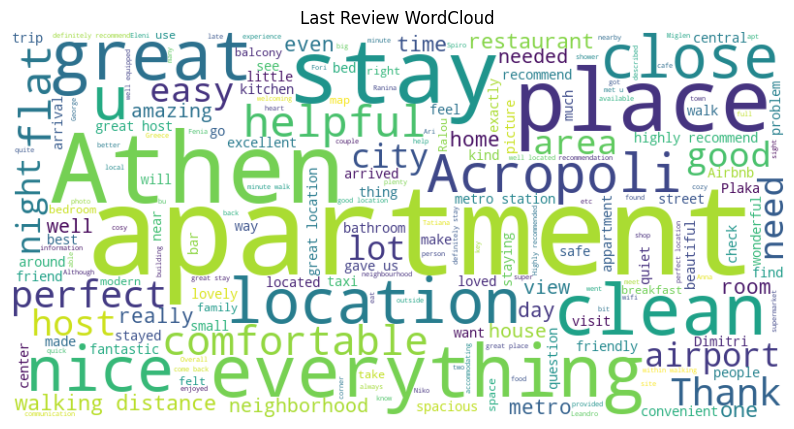

In [31]:

def wordclouds(new_data):
    # Δημιουργία ενός WordCloud από τη στήλη "neighbourhood"
    neighbourhood_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(
        ' '.join(new_data['neighbourhood'].dropna()))
    plt.figure(figsize=(10, 6))
    plt.imshow(neighbourhood_wordcloud, interpolation='bilinear')
    plt.title('Neighbourhood WordCloud')
    plt.axis('off')
    plt.show()

    # # Δημιουργία ενός WordCloud από τη στήλη "transit"
    transit_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(
        ' '.join(new_data['transit'].dropna()))
    plt.figure(figsize=(10, 6))
    plt.imshow(transit_wordcloud, interpolation='bilinear')
    plt.title('Transit WordCloud')
    plt.axis('off')
    plt.show()

    # # Δημιουργία ενός WordCloud από τη στήλη "description"
    description_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(
        ' '.join(new_data['description'].dropna()))
    plt.figure(figsize=(10, 6))
    plt.imshow(description_wordcloud, interpolation='bilinear')
    plt.title('Description WordCloud')
    plt.axis('off')
    plt.show()

    # Δημιουργία ενός WordCloud από τη στήλη "last_review"
    last_review_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(
        ' '.join(new_data['comments'].dropna()))
    plt.figure(figsize=(10, 6))
    plt.imshow(last_review_wordcloud, interpolation='bilinear')
    plt.title('Last Review WordCloud')
    plt.axis('off')
    plt.show()


def wordclouds_2023(new_data):
    new_data2 = new_data.replace('br', '', regex=True)
    new_data2 = new_data.replace('b', '', regex=True)
    # Δημιουργία ενός WordCloud από τη στήλη "neighbourhood"
    neighbourhood_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(
        ' '.join(new_data2['neighbourhood_cleansed'].dropna()))
    plt.figure(figsize=(10, 6))
    plt.imshow(neighbourhood_wordcloud, interpolation='bilinear')
    plt.title('Neighbourhood WordCloud')
    plt.axis('off')
    plt.show()

    # # Δημιουργία ενός WordCloud από τη στήλη "description"
    description_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(
        ' '.join(new_data2['description'].dropna()))
    plt.figure(figsize=(10, 6))
    plt.imshow(description_wordcloud, interpolation='bilinear')
    plt.title('Description WordCloud')
    plt.axis('off')
    plt.show()

    # Δημιουργία ενός WordCloud από τη στήλη "last_review"
    last_review_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(
        ' '.join(new_data2['comments'].dropna()))
    plt.figure(figsize=(10, 6))
    plt.imshow(last_review_wordcloud, interpolation='bilinear')
    plt.title('Last Review WordCloud')
    plt.axis('off')
    plt.show()

#Calling func for 2019
wordclouds(new_data)
#Calling func for 2023
wordclouds(new_data)

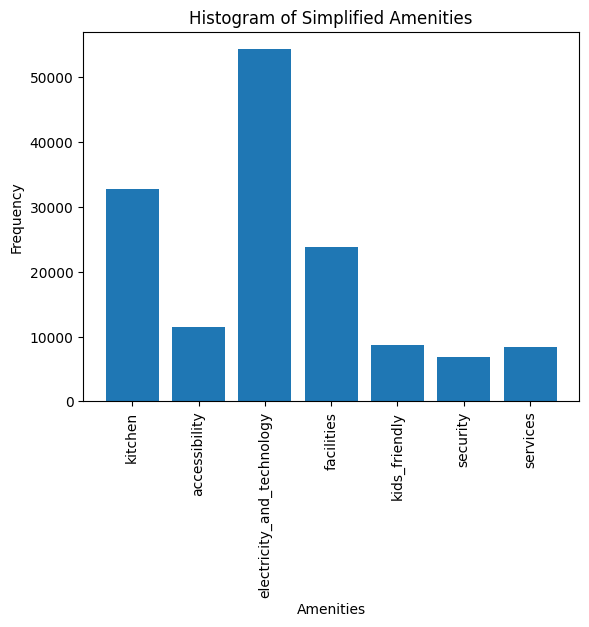

In [32]:

#1.11 Αντικαταστάση τιμών και σχεδίαση ιστογράμματων συχνότητας νέων τιμών
def amenities(new_data):
    # Δημιουργούμε ενα dictionary με τις τιμές που πρόκειται να αντικαθιστούν
    categories = {
        'kitchen': ['Breakfast', '"Cooking basics"', 'BBQ', 'Grill', 'Oven', '"Coffee maker"', 'Stove'],
        'accessibility': ['"Paid parking off premises"', '"Free street parking"'],
        'electricity_and_technology': ['Wifi', 'TV', '"Cable TV"', 'Internet', '"Air conditioning"', 'Refrigerator'],
        'facilities': ['"Patio or balcony"', 'Elevator', '"Fire extinguisher"', ...],
        'kids_friendly': ['"Family/kid friendly"', '"Children’s books and toys"'],
        'security': ['"Safety card"', '"Smoke detector"'],
        'services': ['"Luggage dropoff allowed"', '"Buzzer/wireless intercom"', '"24-hour check-in"']
    }
    #Δημιουργούμε μια λίστα με τα amenities κάθε ακινήτου
    amenities_list = new_data['amenities'].apply(lambda x: x.strip('{}').split(',')).tolist()



    #Αντικατάσταση των τιμών βάση του dictionary που δημιουργήσαμε παραπάνω
    for amenities_index, amenities in enumerate(amenities_list):
        for amenity_index, amenity in enumerate(amenities):
            for category, items in categories.items():
                for item in items:
                    if amenity == item:
                        amenities_list[amenities_index][amenity_index] = category
    new_data['amenities'] = amenities_list
    #Επεξεργασία του dictionary για να γίνει στη συνέχεια καταγρασή της συχνότητας των τιμών
    categories = {
        'kitchen': 0,
        'accessibility': 0,
        'electricity_and_technology': 0,
        'facilities': 0,
        'kids_friendly': 0,
        'security': 0,
        'services': 0
    }

    for amenity in amenities_list:
        for item in amenity:
            if item in categories:
                categories[item] += 1

    #Ιστόγραμμα
    plt.bar(categories.keys(), categories.values())
    plt.xlabel('Amenities')
    plt.ylabel('Frequency')
    plt.title('Histogram of Simplified Amenities')
    plt.xticks(rotation=90)
    plt.show()

#Calling func for 2019
amenities(new_data)

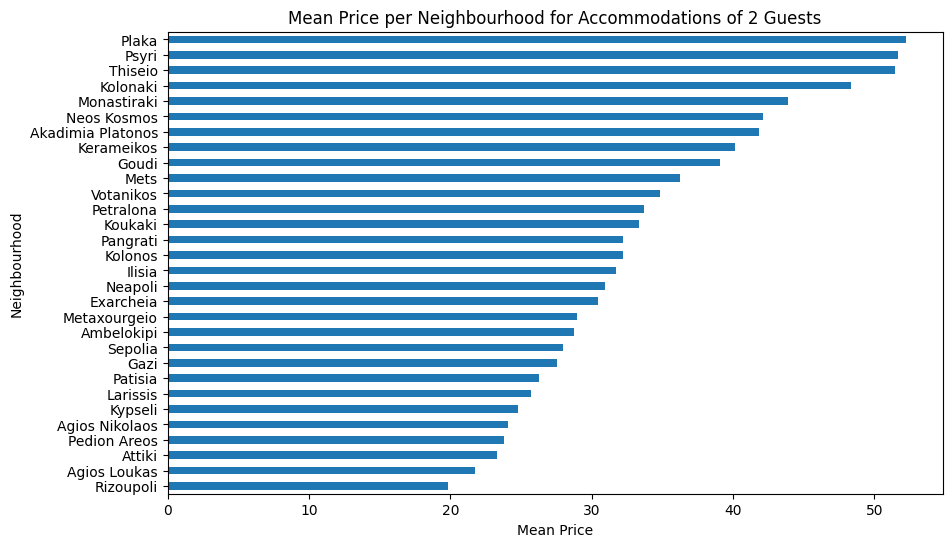

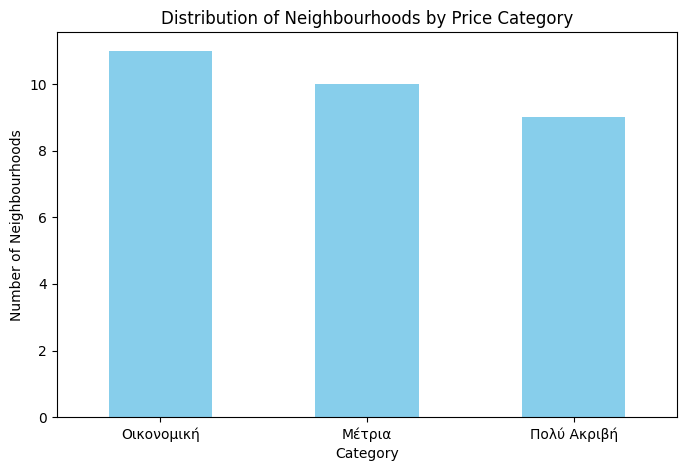

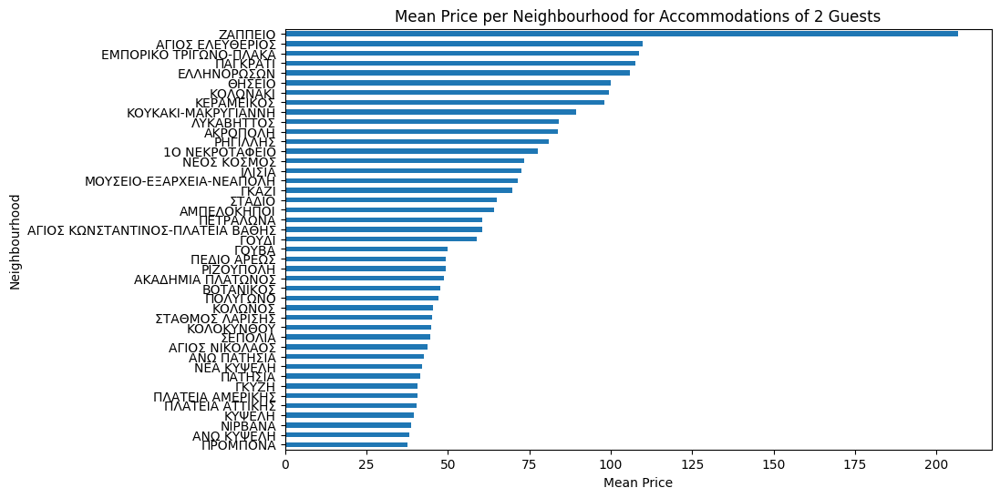

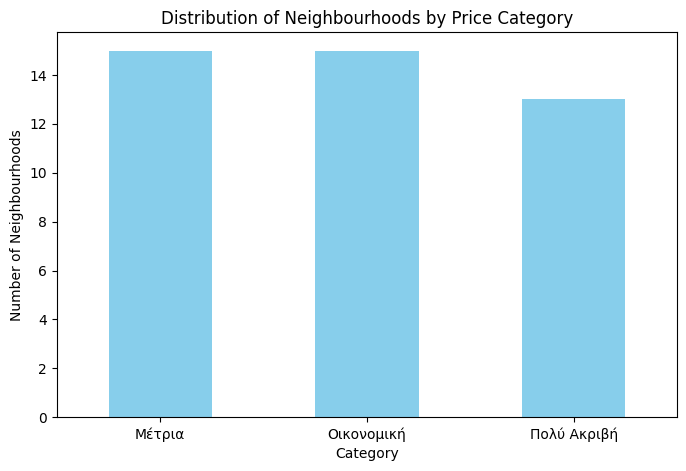

In [33]:

#1.12 Κατηγοριοποίηση των neighbourhoods σε ακριβές, μέτριες, οικονομικές
def neighbourhood_prices(new_data):
    # Βρίσκουμε τις γειτονιές που φιλοξενούν 2 άτομα
    neighbourhood_data = new_data[new_data['accommodates'] == 2]

    # Υπολογισμός της μέσης τιμής ανά γειτονιά
    mean_price_per_neighbourhood = neighbourhood_data.groupby('neighbourhood')['price'].mean()

    # Ταξινόμηση των γειτονιών βάσει της μέσης τιμής
    sorted_neighbourhoods = mean_price_per_neighbourhood.sort_values()

    #Γράφημα
    plt.figure(figsize=(10,6))
    sorted_neighbourhoods.plot(kind='barh')
    plt.xlabel('Mean Price')
    plt.ylabel('Neighbourhood')
    plt.title('Mean Price per Neighbourhood for Accommodations of 2 Guests')
    plt.show()

    # Ορίζουμε τα φράγματα που θα διαχωρίσουν τις γειτονιές σε 3 κατηγορίες
    low_price_limit = mean_price_per_neighbourhood.quantile(0.35)
    high_price_limit = mean_price_per_neighbourhood.quantile(0.70)

    def categorize_neighbourhood(price):
        if price < low_price_limit:
            return 'Οικονομική'
        elif low_price_limit<= price < high_price_limit:
            return 'Μέτρια'
        else:
            return 'Πολύ Ακριβή'

    # Διαχωρισμός γειτονιών μέσω της συνάρτησης categorize_neighbourhood
    neighbourhood_category = mean_price_per_neighbourhood.apply(categorize_neighbourhood)

    #Γράφημα
    plt.figure(figsize=(8, 5))
    neighbourhood_category.value_counts().plot(kind='bar', color='skyblue')
    plt.xlabel('Category')
    plt.ylabel('Number of Neighbourhoods')
    plt.title('Distribution of Neighbourhoods by Price Category')
    plt.xticks(rotation=0)
    plt.show()


def neighbourhood_prices_2023(new_data):
    # Βρίσκουμε τις γειτονιές που φιλοξενούν 2 άτομα
    neighbourhood_data = new_data[new_data['accommodates'] == 2]

    # Υπολογισμός της μέσης τιμής ανά γειτονιά
    mean_price_per_neighbourhood = neighbourhood_data.groupby('neighbourhood_cleansed')['price'].mean()

    # Ταξινόμηση των γειτονιών βάσει της μέσης τιμής
    sorted_neighbourhoods = mean_price_per_neighbourhood.sort_values()

    #Γράφημα
    plt.figure(figsize=(10,6))
    sorted_neighbourhoods.plot(kind='barh')
    plt.xlabel('Mean Price')
    plt.ylabel('Neighbourhood')
    plt.title('Mean Price per Neighbourhood for Accommodations of 2 Guests')
    plt.show()

    # Ορίζουμε τα φράγματα που θα διαχωρίσουν τις γειτονιές σε 3 κατηγορίες
    low_price_limit = mean_price_per_neighbourhood.quantile(0.35)
    high_price_limit = mean_price_per_neighbourhood.quantile(0.70)

    def categorize_neighbourhood(price):
        if price < low_price_limit:
            return 'Οικονομική'
        elif low_price_limit<= price < high_price_limit:
            return 'Μέτρια'
        else:
            return 'Πολύ Ακριβή'

    # Διαχωρισμός γειτονιών μέσω της συνάρτησης categorize_neighbourhood
    neighbourhood_category = mean_price_per_neighbourhood.apply(categorize_neighbourhood)

    #Γράφημα
    plt.figure(figsize=(8, 5))
    neighbourhood_category.value_counts().plot(kind='bar', color='skyblue')
    plt.xlabel('Category')
    plt.ylabel('Number of Neighbourhoods')
    plt.title('Distribution of Neighbourhoods by Price Category')
    plt.xticks(rotation=0)
    plt.show()


#Calling func for 2019
neighbourhood_prices(new_data)
#Calling func for 2023
neighbourhood_prices_2023(new_data1)

In [34]:

#1.13
def question_1_13(new_data):
    #1.13 α
    # Υπολογισμός του ποσοστού των καταλυμάτων που είναι kids and family friendly
    total_accommodations = len(new_data)
    sum = 0
    for amenity in new_data['amenities']:
        for item in amenity:
            if item == 'kids_friendly':
                sum += 1
                break

    percentage_kids_friendly = (sum / total_accommodations) * 100

    # Εκτύπωση του ποσοστού
    print("Το ποσοστό των καταλυμάτων που είναι kids and family friendly είναι: {:.2f}%".format(percentage_kids_friendly))

    # 1.13 β
    #Υπολογισμός ποσοστού καταλυμάτων που η τιμή τους είναι χαμηλότερη του μέσου όρου και παρέχουν υπηρεσίες security.
    # Υπολογισμός της μέσης τιμής των τιμών των καταλυμάτων
    mean_price = new_data['price'].mean()

    # Υπολογισμός καταλυμάτων που πληρούν τα κριτήρια
    sum = 0
    for index, row in new_data.iterrows():
        amenity = row['amenities']
        price = row['price']
        if price <= mean_price:
            for item in amenity:
                if item == 'security':
                    sum += 1
                    break

    security_mean_price = (sum / total_accommodations) * 100

    # Εκτύπωση του ποσοστού
    print("Το ποσοστό των καταλυμάτων που έχουν τιμή μικρότερη απο τον μέσο όρο και ανήκουν στην κατηγορία security είναι: {:.2f}%".format(security_mean_price))

    # 1.13 γ
    #Υπολογισμός ποσοστού που υποστηρίζουν άμεση κράτηση ανα γειτονιά.
    # Ομαδοποίηση βάσει της στήλης "neighbourhood" και υπολογισμός του ποσοστού άμεσης κράτησης
    instant_bookable_percentage = new_data.groupby('neighbourhood')['instant_bookable'].apply(lambda x: (x == 't').mean() * 100)

    # Εκτύπωση του ποσοστού των καταλυμάτων που προσφέρουν άμεση κράτηση ανά περιοχή
    print("Tο ποσοστό των καταλυμάτων που υποστηρίζουν άμεση κράτηση, ανα γειτονιά:")
    print(instant_bookable_percentage)


#Calling func for 2019
question_1_13(new_data)

Το ποσοστό των καταλυμάτων που είναι kids and family friendly είναι: 55.35%
Το ποσοστό των καταλυμάτων που έχουν τιμή μικρότερη απο τον μέσο όρο και ανήκουν στην κατηγορία security είναι: 24.10%
Tο ποσοστό των καταλυμάτων που υποστηρίζουν άμεση κράτηση, ανα γειτονιά:
neighbourhood
Agios Loukas          83.928571
Agios Nikolaos        75.280899
Akadimia Platonos     83.333333
Ambelokipi            72.418478
Attiki                80.800000
Exarcheia             70.952381
Gazi                  72.222222
Goudi                 80.000000
Ilisia                76.763485
Kerameikos            75.917431
Kolonaki              72.247706
Kolonos               73.267327
Koukaki               82.842785
Kypseli               63.636364
Larissis              86.114820
Metaxourgeio          79.899497
Mets                  76.794258
Monastiraki           82.500000
Neapoli               78.980892
Neos Kosmos           79.613900
Pangrati              75.233645
Patisia               72.500000
Pedion Areos  

In [35]:
#1.13 for 2023

def question_1_13_2023(new_data):
    #1.13 α
    # Υπολογισμός του ποσοστού των καταλυμάτων που είναι στους Αμπελόκηπους.
    total_accommodations = len(new_data)
    sum = 0
    for neighbourhood in new_data['neighbourhood_cleansed']:
        if neighbourhood == 'ΑΜΠΕΛΟΚΗΠΟΙ':
            sum += 1


    percentage_ampelokhpoi = (sum / total_accommodations) * 100

    # Εκτύπωση του ποσοστού
    print("Το ποσοστό των καταλυμάτων που είναι στους Αμπελόκηπους: {:.2f}%".format(percentage_ampelokhpoi))

    # 1.13 β
    # Υπολογισμός ποσοστού καταλυμάτων που η τιμή τους είναι χαμηλότερη του μέσου όρου
    # Υπολογισμός της μέσης τιμής των τιμών των καταλυμάτων
    mean_price = new_data['price'].mean()

    # Υπολογισμός καταλυμάτων που πληρούν τα κριτήρια
    sum = 0
    for price in new_data['price']:
        if price <= mean_price:
            sum += 1


    lower_than_mean = (sum / total_accommodations) * 100

    # Εκτύπωση του ποσοστού
    print("Το ποσοστό των καταλυμάτων που έχουν τιμή μικρότερη απο τον μέσο όρο είναι: {:.2f}%".format(lower_than_mean))

    # 1.13 γ
    'Entire home / apt'
    #Υπολογισμός ποσοστού που υποστηρίζουν άμεση κράτηση ανα γειτονιά.
    # Ομαδοποίηση βάσει της στήλης "neighbourhood" και υπολογισμός του ποσοστού άμεσης κράτησης
    instant_bookable_percentage = new_data.groupby('neighbourhood_cleansed')['instant_bookable'].apply(lambda x: (x == 't').mean() * 100)

    # Εκτύπωση του ποσοστού των καταλυμάτων που προσφέρουν άμεση κράτηση ανά περιοχή
    print("Tο ποσοστό των καταλυμάτων που υποστηρίζουν άμεση κράτηση, ανα γειτονιά:")
    print(instant_bookable_percentage)

#Calling func for 2023
question_1_13_2023(new_data1)

Το ποσοστό των καταλυμάτων που είναι στους Αμπελόκηπους: 3.37%
Το ποσοστό των καταλυμάτων που έχουν τιμή μικρότερη απο τον μέσο όρο είναι: 74.32%
Tο ποσοστό των καταλυμάτων που υποστηρίζουν άμεση κράτηση, ανα γειτονιά:
neighbourhood_cleansed
1Ο ΝΕΚΡΟΤΑΦΕΙΟ                      59.602649
ΑΓΙΟΣ ΕΛΕΥΘΕΡΙΟΣ                    35.353535
ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ    59.370904
ΑΓΙΟΣ ΝΙΚΟΛΑΟΣ                      43.650794
ΑΚΑΔΗΜΙΑ ΠΛΑΤΩΝΟΣ                   47.169811
ΑΚΡΟΠΟΛΗ                            61.090909
ΑΜΠΕΛΟΚΗΠΟΙ                         56.265158
ΑΝΩ ΚΥΨΕΛΗ                          52.515723
ΑΝΩ ΠΑΤΗΣΙΑ                         36.065574
ΒΟΤΑΝΙΚΟΣ                           58.928571
ΓΚΑΖΙ                               63.492063
ΓΚΥΖΗ                               43.312102
ΓΟΥΒΑ                               54.066986
ΓΟΥΔΙ                               58.715596
ΕΛΛΗΝΟΡΩΣΩΝ                         44.444444
ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ              69.631858
ΖΑΠΠΕΙΟ               

In [38]:
#1.14
def host_id_listings(new_data):
    # Ομαδοποίηση των δεδομένων βάσει του host_id και υπολογισμός του αριθμού των ακινήτων ανά ιδιοκτήτη
    top_hosts = new_data.groupby('host_id')['id'].nunique().reset_index(name='num_host_listings')

    # Επιλογή των 10 hosts με τα περισσότερα ακίνητα
    top_hosts = top_hosts.sort_values(by='num_host_listings', ascending=False).head(10)

    print(top_hosts)

#Calling func for 2019
host_id_listings(new_data)
#Calling func for 2023
host_id_listings(new_data1)


        host_id  num_host_listings
803    29927830                 89
86      1621474                 61
73      1418201                 56
1855  112527018                 53
1231   55670751                 37
99      2089542                 36
1365   65714690                 34
598    20104194                 29
125     2718115                 25
2315  159175631                 25
        host_id  num_host_listings
665    20104194                116
908    29927830                115
2240  113548208                 90
1954   90390850                 89
62       748818                 76
3105  182156346                 68
133     2089542                 62
1242   47267002                 61
2238  113353393                 60
2338  123074489                 58


In [8]:
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
from stop_words import get_stop_words
import pandas as pd
import numpy as np

#Αποθηκέυουμε στο new_data το CSV που έχουμε φτιάξει στο 1το ερώτημα!
new_data = pd.read_csv('train_2019')

# Λίστα με τα ελληνικά stop words
greek_stop_words = {'και', 'στη', 'στο', 'το', 'του', 'της', 'από', 'για', 'στις', 'στον', 'των'}

# Συνδυασμός των αγγλικών και ελληνικών stop words
all_stop_words = ENGLISH_STOP_WORDS.union(greek_stop_words)

# Αφαίρεση των stop words από τη στήλη description
new_data['description'] = new_data['description'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in all_stop_words]))

# Δημιουργία νέας στήλης με τη συνένωση των στηλών 'name' και 'description'
new_data['name_description'] = new_data['name'].fillna('') + ' ' + new_data['description'].fillna('')

# Εμφάνιση των πρώτων πέντε γραμμών της νέας στήλης
def check_stop_words(text):
    words = text.split()
    for word in words:
        if word.lower() in all_stop_words:
            return True
    print(text)
    return False

# Εφαρμογή της λειτουργίας στη στήλη name_description και επιστροφή μόνο των γραμμών όπου υπάρχει stop word
# Δημιουργία ενός TfidfVectorizer με χρήση των stopwords
# 5% των δεδομένων
new_data = new_data.sample(frac=0.05, random_state=42)
import re
import unicodedata
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english')
# Συνάρτηση για την αφαίρεση των μη αγγλικών χαρακτήρων από το κείμενο
def keep_only_english(text):
    return re.sub(r'[^a-zA-Zα-ωΑ-Ω\s]', ' ', text)

# Εφαρμογή της συνάρτησης για κάθε έγγραφο
new_data['name_description'] = [keep_only_english(i) for i in new_data['name_description']]
# Εφαρμογή του TfidfVectorizer στη στήλη 'name_description'
tfidf_matrix = tfidf_vectorizer.fit_transform(new_data['name_description'])


#2.1
from sklearn.metrics.pairwise import cosine_similarity

# Υπολογισμός της ομοιότητας μεταξύ όλων των ζευγαριών ακινήτων
similarities = cosine_similarity(tfidf_matrix, tfidf_matrix)
similar_properties = {}


for id in new_data['id']:
    similar_properties[id] = []
i =0
for id in new_data['id']:
    j = 0
    for id2 in new_data['id']:
        if id != id2:
            similarity = similarities[i][j]
            similar_properties[id].append((id2, similarity))
        j+=1
    i+=1



max_dict = {}
max_array = np.zeros(100)
for same in range(100):
    max_cos = -1
    for id in new_data['id']:
        value = similar_properties[id]
        for i,j in  value:
            if id != i:
                cos = j
                tuple_to_check = (id,i,cos)
                tuple_to_check_2 = (i,id,cos)
                if(max_cos < cos and tuple_to_check not in max_dict.values() and tuple_to_check_2 not in max_dict.values()):
                    max_cos = cos
                    max_dict[same] = (id,i,max_cos)
                    max_array[same] = max_cos


#2.3
# Ταξινόμηση των πιο όμοιων ακινήτων για κάθε ακίνητο
def recommend(item_id, num):
    similar_properties[item_id] = sorted(similar_properties[item_id], key=lambda x: x[1], reverse=True)[:num]
    print(similar_properties[item_id])
    print("Recommending 5 listings similar to Studio")
    print("---------------------------------------------------------")
    counter=0

    for i,j in similar_properties[item_id]:
        if counter == num:
            break
        for index, row in new_data.iterrows():
            description = row['description']
            name = row['name']
            id = row['id']

            if id == i:
                print("Name: "+name)
                print("Description:"+description)
                print("Score: " + str(j))
        counter+=1


recommend(24880934,5)



[(25760183, 0.8337959360599687), (16268109, 0.4459142394082454), (17853497, 0.23539116747656721), (14889786, 0.22122098933801465), (16132023, 0.2204670317689777)]
Recommending 5 listings similar to Studio
---------------------------------------------------------
Name: Charming Sunny Studio in Athens
Description:Feel like home lovely cozy 39 sq. M. studio apartment Athens, Located near metro station EVANGELISMOS (direct connection airport). place perfect couples, solo adventurers business travelers. apartment elevated Ground floor, bright, fully equipped cozy. apt quiet, fully renovated comfort. Near metro station "Evangelismos" heart residential neighbourhood Pangrati, steps majestic Panathenaic Stadium. apartment equipped with: - Wi-Fi - TV - A/C - new equipped kitchen Nespresso machine - Washing machine, Iron & Ironing board - double bed (1,60x2,00m) - Single sofa bed - bathroom guests use flat amenities. I, Kitty Luca welcome apartment check-in orientation apartment's amenities give

In [9]:
#2.4
import nltk
from nltk.collocations import BigramCollocationFinder
from nltk.metrics import BigramAssocMeasures

bigram_measures = BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(' '.join(list(new_data['description'])).split())
top10_collocations = finder.nbest(BigramAssocMeasures.pmi, 10)


print("Top-10 words which commonly co-occur: \n")
for pair_words in top10_collocations:
    print("{} - {}".format(pair_words[0], pair_words[1]))

Top-10 words which commonly co-occur: 

"Agia - Marina"
"Ano - Petralona",closed
"Areos - park"
"Attica - Grove's
"Fokionos - Negri"
"Harmonia" - "Erato"
"Kato - Patissia"
"Laiko" - "Genimatas.
"Little - Column",
"Neos - Kosmos"
